In [2]:
# import libraries

import numpy as np
import pandas as pd
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML


save_dict = {
    'metadata': { ... },
    'best_dna': None,  # You can ignore this
    'best_score': float('-inf'),  # You can ignore this
    'gen_0': {
        'population': [
            {'dna': [...], 'dna_score': score1},
            {'dna': [...], 'dna_score': score2},
            # ... all DNA sequences in generation 0
        ],
        'timestamp': '...'
    },
    'gen_1': {
        'population': [
            {'dna': [...], 'dna_score': score1},
            {'dna': [...], 'dna_score': score2},
            # ... all DNA sequences in generation 1
        ],
        'timestamp': '...'
    },
    # ... and so on for each generation
}

In [3]:

"""
Successful Runs:
/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-05-12_08-53-19.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-05-15_05-37-08.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-05-20_18-52-52.pkl
"""


file_path = '/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-05-25_19-07-58.pkl'

ga_results=load_ga_run_to_df(file_path)

display(ga_results)



,generation,dna,dna_score
0,10,"(0, 6, 7, 262, -179, 600, 18, 600, 0, -20, -4,...",638
1,9,"(0, 6, 7, 262, -179, 600, 18, 600, 0, -20, -4,...",638
2,10,"(6, 15, 8, 12, -66, 33, 0, 558, 17, -7, -1, -6...",637
3,10,"(0, 5, 3, 140, -35, 70, 12, 600, 10, -6, -31, ...",637
4,7,"(20, 7, 5, 341, -35, 96, 77, 600, 10, -19, -60...",637
...,...,...,...
1095,0,"(129, 150, 437, 344, -236, 236, 556, 284, 188,...",309
1096,1,"(432, 521, 600, 291, -207, 521, 66, 289, 209, ...",299
1097,2,"(167, 201, 105, 385, -240, 456, 95, 600, 459, ...",286
1098,1,"(221, 600, 464, 600, -372, 16, 33, 600, 317, -...",265


In [4]:
# Count duplicates in ga_results
duplicate_counts = ga_results.duplicated(subset=['dna'], keep=False).sum()
print(f"Number of duplicate DNA sequences: {duplicate_counts}")

# Show the actual duplicates
duplicates = ga_results[ga_results.duplicated(subset=['dna'], keep=False)]
print("\nDuplicate entries:")
display(duplicates)

Number of duplicate DNA sequences: 90

Duplicate entries:


,generation,dna,dna_score
0,10,"(0, 6, 7, 262, -179, 600, 18, 600, 0, -20, -4,...",638
1,9,"(0, 6, 7, 262, -179, 600, 18, 600, 0, -20, -4,...",638
2,10,"(6, 15, 8, 12, -66, 33, 0, 558, 17, -7, -1, -6...",637
4,7,"(20, 7, 5, 341, -35, 96, 77, 600, 10, -19, -60...",637
5,7,"(4, 8, 8, 316, -203, 45, 12, 600, 26, -22, -30...",637
...,...,...,...
767,1,"(356, 458, 493, 216, -594, 483, 352, 249, 412,...",560
778,1,"(574, 151, 442, 271, -445, 498, 569, 360, 3, -...",557
779,0,"(574, 151, 442, 271, -445, 498, 569, 360, 3, -...",557
798,1,"(63, 190, 285, 416, -84, 196, 481, 546, 294, -...",555


In [17]:
# Filter ga_results to only include rows where dna_score > 730
high_scoring_df = ga_results[ga_results['dna_score'] > 730]

# Display the filtered dataframe
display(high_scoring_df)

# Print basic statistics about the filtered data
print(f"\nNumber of high-scoring configurations: {len(high_scoring_df)}")
print(f"Score range: {high_scoring_df['dna_score'].min()} to {high_scoring_df['dna_score'].max()}")

# Count unique configurations among high-scoring DNA
unique_configs = {}
for index, row in high_scoring_df.iterrows():
    config = tuple(1 if weight != 0 else 0 for weight in row['dna'])
    if config not in unique_configs:
        unique_configs[config] = {
            'count': 1,
            'min_score': row['dna_score'],
            'max_score': row['dna_score']
        }
    else:
        unique_configs[config]['count'] += 1
        unique_configs[config]['min_score'] = min(unique_configs[config]['min_score'], row['dna_score'])
        unique_configs[config]['max_score'] = max(unique_configs[config]['max_score'], row['dna_score'])

print(f"\nNumber of unique configurations: {len(unique_configs)}")
print("\nConfiguration details:")
for config, details in unique_configs.items():
    print(f"Config: {config}")
    print(f"  Count: {details['count']}")
    print(f"  Score range: {details['min_score']} to {details['max_score']}")
    print()


,generation,dna,dna_score
0,286,"(500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, ...",735
1,239,"(500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, ...",735
2,296,"(500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, ...",735
3,267,"(500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, ...",735
4,282,"(500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, ...",735
...,...,...,...
620,250,"(160, 0, 0, 0, 0, 0, 56, 0, 0, -7, -35, 0, 0, ...",731
621,246,"(160, 0, 0, 0, 0, 0, 56, 0, 0, -7, -35, 0, 0, ...",731
622,299,"(160, 0, 0, 0, 0, 0, 56, 0, 0, -7, -35, 0, 0, ...",731
623,210,"(160, 0, 0, 0, 0, 0, 7, 0, 0, -4, -35, 0, 0, 0...",731



Number of high-scoring configurations: 625
Score range: 731 to 735

Number of unique configurations: 2

Configuration details:
Config: (1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1)
  Count: 534
  Score range: 731 to 735

Config: (1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1)
  Count: 91
  Score range: 731 to 731



In [18]:
## Counting unique configurations

import pandas as pd

# Assuming ga_results is your DataFrame
qualifier_depth = 10000
max_synapses = 25

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Dictionary to store unique configurations and their details
unique_configs = {}
for index, row in ga_results.head(qualifier_depth).iterrows():
    config = dna_to_nonzero_config(row['dna'])
    # Calculate the number of non-zero entries
    non_zero_count = sum(config)
    # Only consider configurations with non-zero counts of 18 or lower
    if non_zero_count <= max_synapses and config not in unique_configs:
        # Store the index, dna_score, and non-zero count
        unique_configs[config] = {
            'index': index,
            'dna_score': row['dna_score'],
            'non_zero_count': non_zero_count
        }

# Print the unique configurations with their details
for config, details in unique_configs.items():
    print(f"Configuration: {config}, Details: {details}")

Configuration: (1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 0, 'dna_score': 735, 'non_zero_count': 18}
Configuration: (1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 352, 'dna_score': 731, 'non_zero_count': 19}
Configuration: (1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 712, 'dna_score': 727, 'non_zero_count': 17}
Configuration: (1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1), Details: {'index': 713, 'dna_score': 727, 'non

In [19]:
# Calculate the average weight across TOP 100 DNA
import pandas as pd
import numpy as np

# Assuming ga_results is your DataFrame
# Sort by dna_score to get the top 100 scoring DNA
top_100 = ga_results.nlargest(100, 'dna_score')

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Initialize a list to count non-zero occurrences for each position
non_zero_counts = np.zeros(len(top_100.iloc[0]['dna']))

# Initialize a list to sum weights for each position
weight_sums = np.zeros(len(top_100.iloc[0]['dna']))

# Iterate over each DNA list
for index, row in top_100.iterrows():
    dna = row['dna']
    for i, weight in enumerate(dna):
        if weight != 0:
            non_zero_counts[i] += 1
            weight_sums[i] += weight

# Calculate the threshold for 90% presence
threshold = 0.9 * len(top_100)

# Identify positions that are non-zero in 90% or more of the DNA lists
always_on_positions = [i for i, count in enumerate(non_zero_counts) if count >= threshold]

# Calculate average weights for these positions
average_weights = {i: weight_sums[i] / non_zero_counts[i] for i in always_on_positions}

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Map positions to synapses
always_on_synapses = [(ACTIVE_SYNAPSES[i], average_weights[i]) for i in always_on_positions]

# Print the results
print("Synapses that are almost always on (90% or more) in the top 100 scoring DNA:")
for synapse, avg_weight in always_on_synapses:
    print(f"{synapse}: Avg Weight = {avg_weight:.1f}")

Synapses that are almost always on (90% or more) in the top 100 scoring DNA:
['Somat', 'ALMprep']: Avg Weight = 425.7
['Somat', 'MSN1']: Avg Weight = 12.5
['MSN1', 'SNR1']: Avg Weight = -5.4
['MSN1', 'SNR2']: Avg Weight = -59.5
['MSN3', 'SNR3']: Avg Weight = -5.0
['SNR1', 'VMresp']: Avg Weight = -464.1
['SNR3', 'VMresp']: Avg Weight = -138.6
['VMprep', 'ALMprep']: Avg Weight = 18.3
['VMresp', 'ALMresp']: Avg Weight = 437.4
['ALMprep', 'MSN1']: Avg Weight = 205.0
['ALMinter', 'MSN3']: Avg Weight = -31.4
['ALMresp', 'MSN3']: Avg Weight = 261.4
['ALMprep', 'VMprep']: Avg Weight = 468.3
['ALMresp', 'VMresp']: Avg Weight = 74.3
['ALMinter', 'ALMprep']: Avg Weight = -324.9
['PPN', 'THALgo']: Avg Weight = 33.7
['THALgo', 'ALMinter']: Avg Weight = 429.4
['THALgo', 'ALMresp']: Avg Weight = 455.7


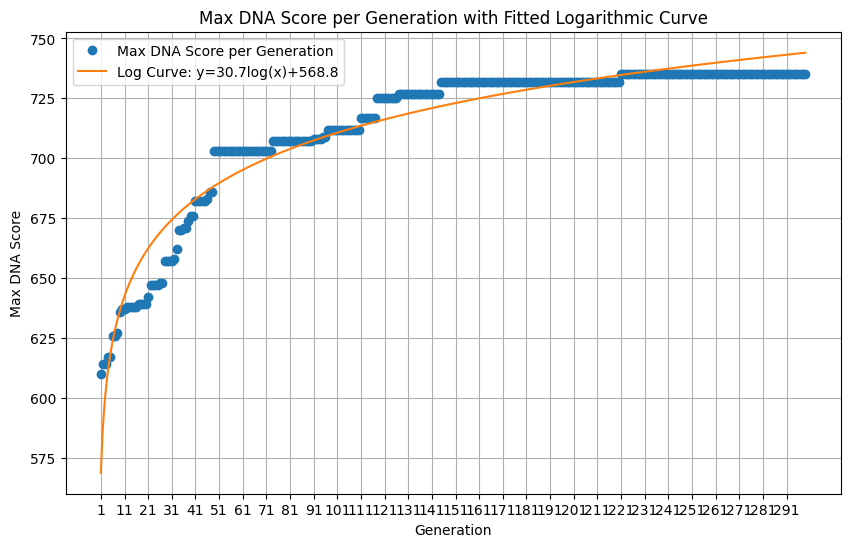

The equation of the fitted curve is: y = 30.75 * log(x) + 568.77


In [20]:
# Max DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df=ga_results
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and find the max 'dna_score' for each group
max_scores_per_generation = df.groupby('generation')['dna_score'].max().reset_index()

# Extract the data for fitting
x = max_scores_per_generation['generation'][1:]
y = max_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)
a,b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Max DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Log Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.title('Max DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()


# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

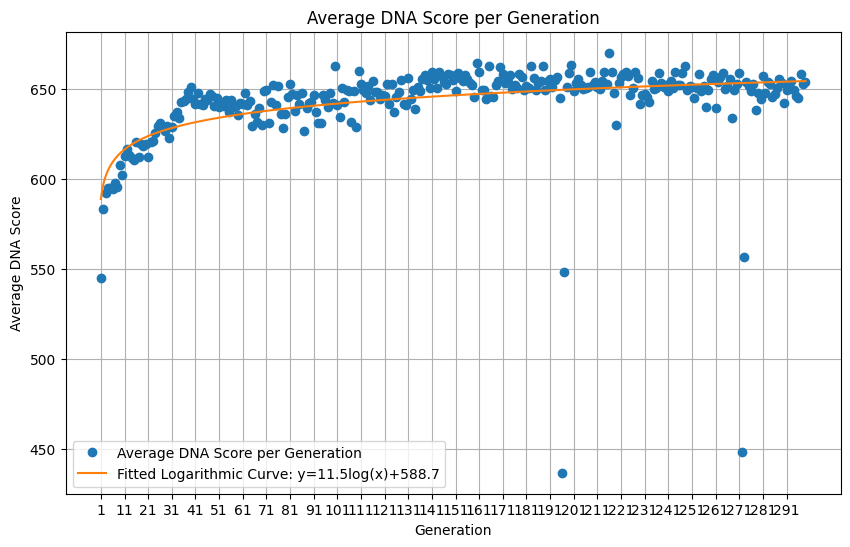

In [21]:
#Average DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and calculate the average 'dna_score' for each group
average_scores_per_generation = df.groupby('generation')['dna_score'].mean().reset_index()

# Extract the data for fitting
x = average_scores_per_generation['generation'][1:]
y = average_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)

# Extract parameters
a, b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Average DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Fitted Logarithmic Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average DNA Score')
plt.title('Average DNA Score per Generation')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()

Number of synapses: 58


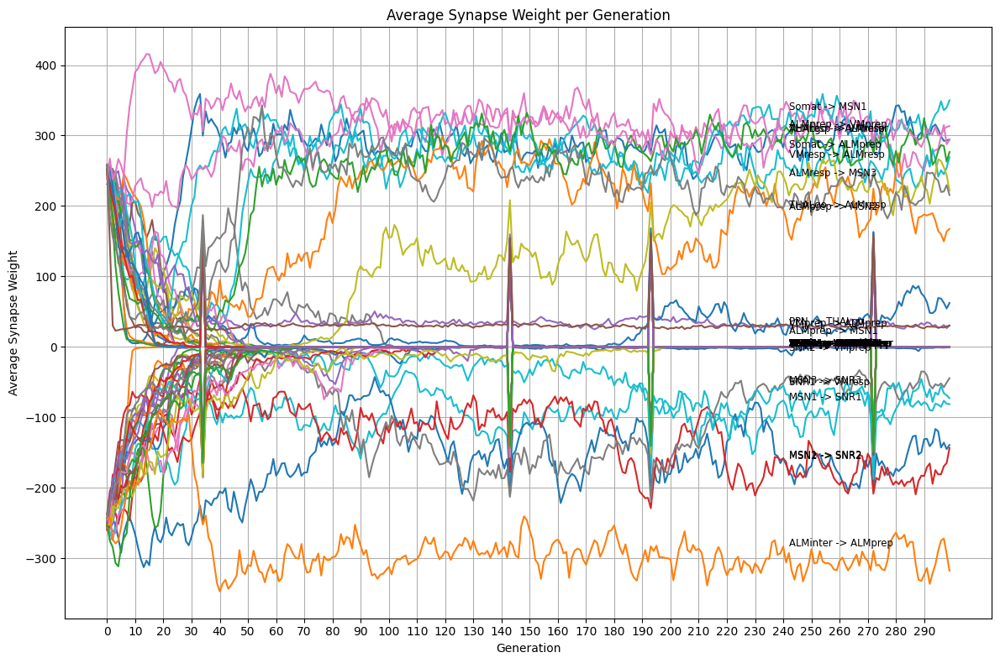

In [9]:
# Evolution of ALL synapse weights over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]

# Plotting
plt.figure(figsize=(12, 8))

# Plot each synapse's average weight over generations
for i in range(num_synapses):  # Use the actual number of synapses
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[i], label=synapse_labels[i])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[i],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[i][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average Synapse Weight')
plt.title('Average Synapse Weight per Generation')

# Set sparse tick marks
plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

In [22]:
# Evolution of EACH synapse weight over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]


def plot_synapse(synapse_index):
    plt.figure(figsize=(12, 8))
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[synapse_index], label=synapse_labels[synapse_index])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[synapse_index],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[synapse_index][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

    # Adding labels and title
    plt.xlabel('Generation')
    plt.ylabel('Average Synapse Weight')
    plt.title(f'Average Synapse Weight per Generation for {synapse_labels[synapse_index]}')

    # Set y-scale from -1000 to 1000
    plt.ylim(-1000, 1000)

    # Set sparse tick marks
    plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

    # Show grid for better readability
    plt.grid(True)

    # Display the plot
    plt.tight_layout()
    plt.show()

# Create an interactive slider to flip through the synapses
interact(plot_synapse, synapse_index=IntSlider(min=0, max=num_synapses-1, step=1, value=0))

Number of synapses: 58


interactive(children=(IntSlider(value=0, description='synapse_index', max=57), Output()), _dom_classes=('widge…

<function __main__.plot_synapse(synapse_index)>

In [23]:
# Synaptic weights for the best run
best_run = ga_results.iloc[0]

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
non_zero_count = (best_run_labeled != 0).sum()

display(best_run_labeled)
len(best_run_labeled)
print(non_zero_count)

Somat -> ALMprep       500
Somat -> ALMinter        0
Somat -> ALMresp         0
ALMprep -> Somat         0
ALMinter -> Somat        0
ALMresp -> Somat         0
Somat -> MSN1           11
Somat -> MSN2            0
Somat -> MSN3            0
MSN1 -> SNR1            -5
MSN1 -> SNR2           -66
MSN1 -> SNR3             0
MSN2 -> SNR1             0
MSN2 -> SNR2             0
MSN2 -> SNR3             0
MSN3 -> SNR1             0
MSN3 -> SNR2             0
MSN3 -> SNR3            -4
SNR1 -> VMprep           0
SNR1 -> VMresp        -500
SNR2 -> VMprep           0
SNR2 -> VMresp           0
SNR3 -> VMprep           0
SNR3 -> VMresp        -118
VMprep -> ALMprep       17
VMprep -> ALMinter       0
VMprep -> ALMresp        0
VMresp -> ALMprep        0
VMresp -> ALMinter       0
VMresp -> ALMresp      500
ALMprep -> MSN1        205
ALMprep -> MSN2          0
ALMprep -> MSN3          0
ALMinter -> MSN1         0
ALMinter -> MSN2         0
ALMinter -> MSN3        -2
ALMresp -> MSN1          0
A

18


In [27]:
# Directed graph of the top 2000 scoring DNA
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, IntSlider

# Filter configurations to only include those with non_zero_count less than 18
filtered_configs = {config: details for config, details in unique_configs.items() if details['dna_score'] > 730}

# Function to determine the width of each edge
def get_edge_width(weight):
    return np.ceil(abs(weight) / 200) + 1

# Function to determine the style of each edge
def get_edge_style(weight):
    return 'dashed' if weight < 0 else 'solid'

# Function to plot a specific configuration
def plot_configuration(config_index):
    config, details = list(filtered_configs.items())[config_index]
    print(f"Configuration: {config}, \n Details: {details}")
    
    # Create a labeled Series for the best run's DNA
    best_run_labeled = pd.Series(ga_results.iloc[details['index']]['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])

    # Create a graph
    G = nx.DiGraph()

    # Add nodes for each neuron
    G.add_nodes_from(NEURON_NAMES)

    # Add edges for non-zero synaptic connections
    for synapse, weight in best_run_labeled.items():
        if weight != 0:
            source, target = synapse.split(' -> ')
            G.add_edge(source, target, weight=weight)

    # Define custom positions for each node
    custom_pos = {
        'Somat': (5, 5.5),
        'MSN1': (5, 4),
        'MSN2': (3, 4),
        'MSN3': (0, 4),
        'SNR1': (5, 2),
        'SNR2': (3, 2),
        'SNR3': (0, 2),
        'ALMinter': (2, 5),
        'PPN': (2, 0),
        'THALgo': (2, 2.5),
        'VMprep': (4, 1),
        'ALMprep': (4, 5),
        'ALMresp': (1, 5),
        'VMresp': (1, 1)
    }

    # Draw the main graph using the custom positions
    plt.figure(figsize=(12, 6))
    edges = G.edges(data=True)
    nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20,
            width=[get_edge_width(data['weight']) for _, _, data in edges],
            style=[get_edge_style(data['weight']) for _, _, data in edges],
            edge_color='black')  # Default edge color

    # Create a slightly offset position for the overlapping arrows
    offset = 0.09  # Adjust this value to control the offset distance
    offset_pos = {node: (x + offset, y + offset) for node, (x, y) in custom_pos.items()}

    # Draw overlapping arrows for specific connections in always_on_synapses
    G_overlap = nx.DiGraph()
    G_overlap.add_edges_from([(source, target) for (source, target), _ in always_on_synapses])

    # Calculate widths based on avg_weight
    overlap_widths = [get_edge_width(avg_weight) for (_, _), avg_weight in always_on_synapses]

    # Draw these edges with a smaller size and red color, including arrowheads
    nx.draw_networkx_edges(G_overlap, pos=offset_pos, edge_color='red', arrows=True, arrowsize=20, width=overlap_widths)

    # Add edge labels
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='gray')

    plt.title('Non-zero Synaptic Connections with Overlapping Arrows')
    plt.show()

# Create an interactive slider to flip through the filtered configurations
interact(plot_configuration, config_index=IntSlider(min=0, max=len(filtered_configs)-1, step=1, value=0))

interactive(children=(IntSlider(value=0, description='config_index', max=1), Output()), _dom_classes=('widget-…

<function __main__.plot_configuration(config_index)>

In [25]:
# Matrix, experimental, and control viz

curr_dna = ga_results.iloc[0]['dna']
# curr_dna = jh_weights

run_experiment(curr_dna, [1,1,0,1])


    === DNA: (500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, 0, 0, 0, 0, -4, 0, -500, 0, 0, 0, -118, 17, 0, 0, 0, 0, 500, 205, 0, 0, 0, 0, -2, 0, 0, 278, 500, 0, 0, 64, 0, 0, 0, 0, 0, 0, 0, 0, -305, 0, 0, 0, 35, 500, 500)
    === Control: 247/500
    === Experimental: 488/500
    === Overall: 735(73.50%)


Currently loaded matrix ---


,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,11.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN1,0.0,0.0,-5.0,0.0,0.0,0.0,-66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-500.0
VMprep,0.0,0.0,0.0,0.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALMprep,0.0,205.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500.0,0.0,0.0,500.0,0.0
ALMinter,0.0,0.0,0.0,0.0,-305.0,0.0,0.0,0.0,0.0,0.0,-2.0,0.0,0.0,0.0


dna_score={'experimental': 488, 'control': 247}: (500, 0, 0, 0, 0, 0, 11, 0, 0, -5, -66, 0, 0, 0, 0, 0, 0, -4, 0, -500, 0, 0, 0, -118, 17, 0, 0, 0, 0, 500, 205, 0, 0, 0, 0, -2, 0, 0, 278, 500, 0, 0, 64, 0, 0, 0, 0, 0, 0, 0, 0, -305, 0, 0, 0, 35, 500, 500)


735